In [1]:
import xscen as xs
import xarray as xr
from xscen import CONFIG
from matplotlib import pyplot as plt
import xclim as xc
import figanos.matplotlib as fg
from datetime import datetime
import cartopy.crs as ccrs
import numpy as np
import random
import glob
from matplotlib import gridspec
from matplotlib.colors import LogNorm
import copy
import xsdba

fg.utils.set_mpl_style('ouranos')
xs.load_config("../config/config_general.yml", "../config/config_region.yml", "../config/paths.yml")

cat = xs.DataCatalog(CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'][0])



/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


# health checks

In [2]:
# print any health checks raised
for f in np.sort(glob.glob(f"{CONFIG['paths']['final']}/checks/NAM-C3/*")):
    print(f.split("/")[-1])
    ds= xr.open_zarr(f)
    for var in ds.data_vars:
        if ds[var].values:
            print(var, ds[var].values)
    print('')

# diagnostiques VALUE

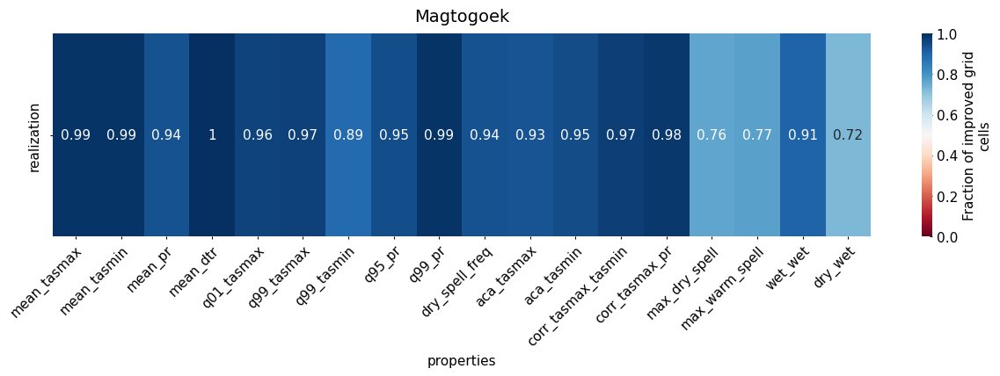

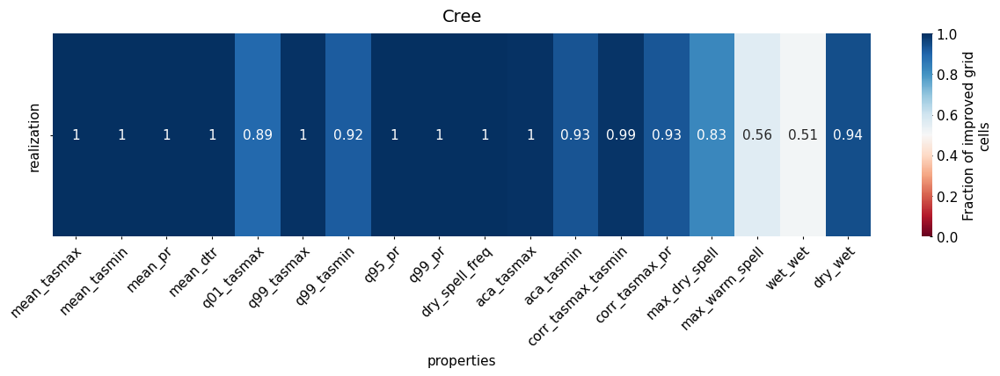

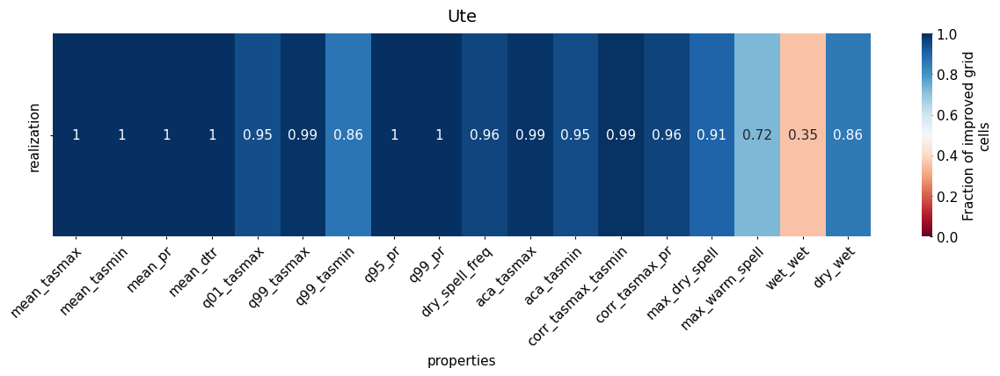

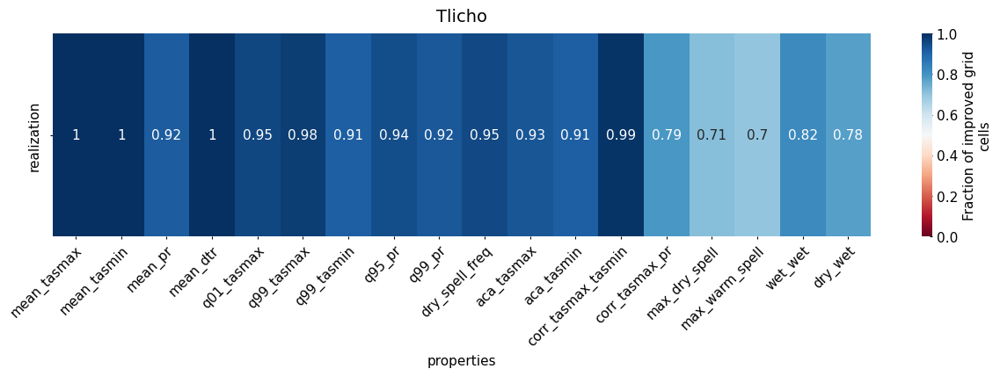

In [3]:
for r in ['Magtogoek','Cree','Ute','Tlicho']:

    imps=[]
    for f in np.sort(glob.glob(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{r}/CMIP6*/*imp.zarr.zip")):
        imp=xr.open_zarr(f, decode_timedelta=False)
        imp=imp.expand_dims(realization=[imp.attrs['cat:id']])
        
        imps.append(imp)

    ds_imp= xr.concat(imps, dim='realization')
    ds_imp=ds_imp.sel(properties=["mean_tasmax","mean_tasmin","mean_pr","mean_dtr","q01_tasmax","q99_tasmax","q99_tasmin","q95_pr","q99_pr","dry_spell_freq","aca_tasmax","aca_tasmin","corr_tasmax_tasmin","corr_tasmax_pr","max_dry_spell","max_warm_spell","wet_wet","dry_wet",])
    #ds_imp=ds_imp.drop_vars(['rotated_pole', 'crs','quantization_info'])
    ds_imp['realization']=['']
    ax=fg.heatmap(ds_imp,plot_kw={'annot':True, 'vmin':0, 'vmax':1}, fig_kw={'figsize':(15,3)})
    ax.set_title(r)

# maps

In [8]:
def _rmse(sim, ref):
    return np.sqrt(np.nanmean((sim - ref) ** 2, axis=-1))

def maps(option_id, option_region, option_var):
    "Load properties and measures and plot them."
    
    # get data from catalogue
    prop_ref=xr.open_zarr(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{option_region}/ref-prop.zarr.zip", decode_timedelta=False)[option_var]
    prop_sim=xr.open_zarr(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{option_region}/{option_id}/{option_id}_NAM-M3_{option_region}_sim-prop.zarr.zip", decode_timedelta=False)[option_var]
    prop_scen=xr.open_zarr(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{option_region}/{option_id}/{option_id}_NAM-M3_{option_region}_scen-prop.zarr.zip", decode_timedelta=False)[option_var]
    meas_sim_prop=xr.open_zarr(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{option_region}/{option_id}/{option_id}_NAM-M3_{option_region}_sim-meas.zarr.zip", decode_timedelta=False)[option_var]
    meas_scen_prop=xr.open_zarr(f"{CONFIG['paths']['final']}/diagnostics/CRCM5-SN-CNRM-ESM2-1/NAM-M3/{option_region}/{option_id}/{option_id}_NAM-M3_{option_region}_scen-meas.zarr.zip", decode_timedelta=False)[option_var]
    
    
    
    #TODO: tmp until run with new xscen and fix xsdba
    prop_ref.attrs['grid_mapping']='crs'
    prop_sim.attrs['grid_mapping']='crs'
    prop_scen.attrs['grid_mapping']='crs'
    meas_sim_prop.attrs['grid_mapping']='crs'
    meas_scen_prop.attrs['grid_mapping']='crs'
    
    #transpose
    # if 'corr_' in option_var or 'max_warm_spell'==option_var or 'max_dry_spell'==option_var:
    #     #prop_ref=prop_ref.transpose()
    #     prop_sim=prop_sim.transpose()
    #     prop_scen=prop_scen.transpose()
    #     meas_sim_prop=meas_sim_prop.transpose()
    #     meas_scen_prop=meas_scen_prop.transpose()


    prop_long_name=prop_sim.attrs['long_name'] 
    meas_long_name=meas_sim_prop.attrs['long_name'] 
    # change units
    if prop_ref.attrs['units']=='kg m-2 s-1':
        prop_ref = xc.core.units.convert_units_to(prop_ref, 'mm d-1', context='hydro')
        prop_sim = xc.core.units.convert_units_to(prop_sim, 'mm d-1', context='hydro')
        prop_scen = xc.core.units.convert_units_to(prop_scen, 'mm d-1', context='hydro')
        meas_sim_prop = xc.core.units.convert_units_to(meas_sim_prop, 'mm d-1', context='hydro')
        meas_scen_prop = xc.core.units.convert_units_to(meas_scen_prop, 'mm d-1', context='hydro')
        
    if prop_ref.attrs['units']=='K':
        prop_ref = xc.core.units.convert_units_to(prop_ref, 'degC')
        prop_sim = xc.core.units.convert_units_to(prop_sim, 'degC')
        prop_scen = xc.core.units.convert_units_to(prop_scen, 'degC')
        
    #set colormap
    maxi_prop = max(prop_ref.max().values, prop_scen.max().values, prop_sim.max().values)
    mini_prop = min(prop_ref.min().values, prop_scen.min().values, prop_sim.min().values)
    maxi_meas = float(max(abs(meas_scen_prop).max().values, abs(meas_sim_prop).max().values))

    #plot
    fig = plt.figure(figsize=(15, 8))
    map_proj = fg.utils.get_rotpole(prop_ref)
    gs = gridspec.GridSpec(4, 3)
    ax0= fig.add_subplot(gs[1:3,0],projection=map_proj)
    ax1= fig.add_subplot(gs[:2,1],projection=map_proj)
    ax2= fig.add_subplot(gs[:2,2],projection=map_proj)
    ax3= fig.add_subplot(gs[2:,1],projection=map_proj)
    ax4= fig.add_subplot(gs[2:,2],projection=map_proj)

    plot_kw_prop=dict(add_colorbar=False, vmin=mini_prop,vmax=maxi_prop)
    plot_kw_meas=dict(add_colorbar=False, vmin=-maxi_meas,vmax=maxi_meas)
    features={ 'lakes':{'scale':'110m', 'edgecolor':'black', 'facecolor':'none'},'coastline':{'scale':'50m'}}
    #plot
    # deep copy until bug is fix TODO
    #TODO: choose cmap by end until figanos >5.0.0 is out and can use divergent
    var_group=str(fg.utils.get_var_group("/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/data/ipcc_colors/variable_groups.json",
                                         meas_sim_prop))
    cmap=f"{var_group}_div"
    
    fg.gridmap(prop_ref, ax=ax0, plot_kw=plot_kw_prop, features=copy.deepcopy(features))
    fg.gridmap(prop_sim, ax=ax1, plot_kw=plot_kw_prop, features=copy.deepcopy(features))
    fg.gridmap(prop_scen, ax=ax3, plot_kw=plot_kw_prop, features=copy.deepcopy(features))
    fg.gridmap(meas_sim_prop, ax=ax2, plot_kw=plot_kw_meas,cmap=cmap, features=copy.deepcopy(features))
    fg.gridmap(meas_scen_prop, ax=ax4, plot_kw=plot_kw_meas,cmap=cmap, features=copy.deepcopy(features))

    #prop colorbar
    fig.subplots_adjust(bottom=0.1)
    cbar_ax = fig.add_axes([0.15, 0.01, 0.45, 0.03])
    cb1=fig.colorbar(ax0.get_children()[0], cax=cbar_ax,orientation='horizontal')
    cb1.set_label(label=f"{prop_long_name} ({prop_sim.attrs['units']})",size=13)
    cb1.ax.tick_params(axis='x', direction='out')
    cb1.outline.set_visible(False)
    
    #meas colorbar
    fig.subplots_adjust(bottom=0.1)
    cbar_ax = fig.add_axes([0.68, 0.01, 0.25, 0.03])
    cb2=fig.colorbar(ax2.get_children()[0], cax=cbar_ax,orientation='horizontal')
    cb2.set_label(label=f"{meas_long_name} ({meas_sim_prop.attrs['units']})",size=13)
    
    cb2.ax.tick_params(axis='x', direction='out')
    cb2.outline.set_visible(False)
    
    
    #rmse
    rmse_sim = xr.apply_ufunc(
        _rmse,
        prop_sim.stack(loc=['rlat','rlon']).chunk(dict(loc=-1)),
        prop_ref.stack(loc=['rlat','rlon']).chunk(dict(loc=-1)),
        input_core_dims=[["loc"], ["loc"]],
        dask="parallelized",
    ).values
    
    
    rmse_scen = xr.apply_ufunc(
        _rmse,
        prop_scen.stack(loc=['rlat','rlon']).chunk(dict(loc=-1)),
        prop_ref.stack(loc=['rlat','rlon']).chunk(dict(loc=-1)),
        input_core_dims=[["loc"], ["loc"]],
        dask="parallelized",
    ).values
    
    fs=15
    ax0.set_title(r'a) reference', fontsize=fs)
    ax1.set_title(r'b) original', fontsize=fs)
    prop_sim.attrs['units']=prop_sim.attrs['units'].replace('mm d-1', 'mm/d')
    prop_scen.attrs['units']=prop_scen.attrs['units'].replace('mm d-1', 'mm/d')
    ax2.set_title(f"c) original \n RMSE={rmse_sim:.2f} {prop_sim.attrs['units']}",
                  fontsize=fs)
    ax3.set_title(r'd) bias-adjusted', fontsize=fs)
    ax4.set_title(f"e) bias-adjusted \n RMSE={rmse_scen:.2f} {prop_scen.attrs['units']}",
                  fontsize=fs)
    fig.tight_layout(pad=5.0)
    return fig,[ax0,ax1,ax2,ax3,ax4], [cb1,cb2]
    

/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/tmp/ipykernel_1221874/3533507081.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-

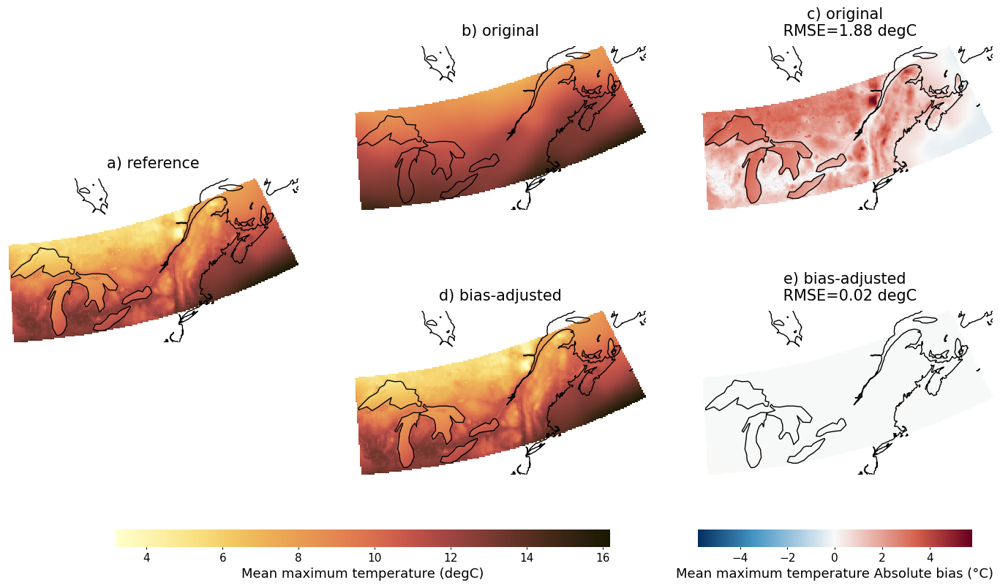

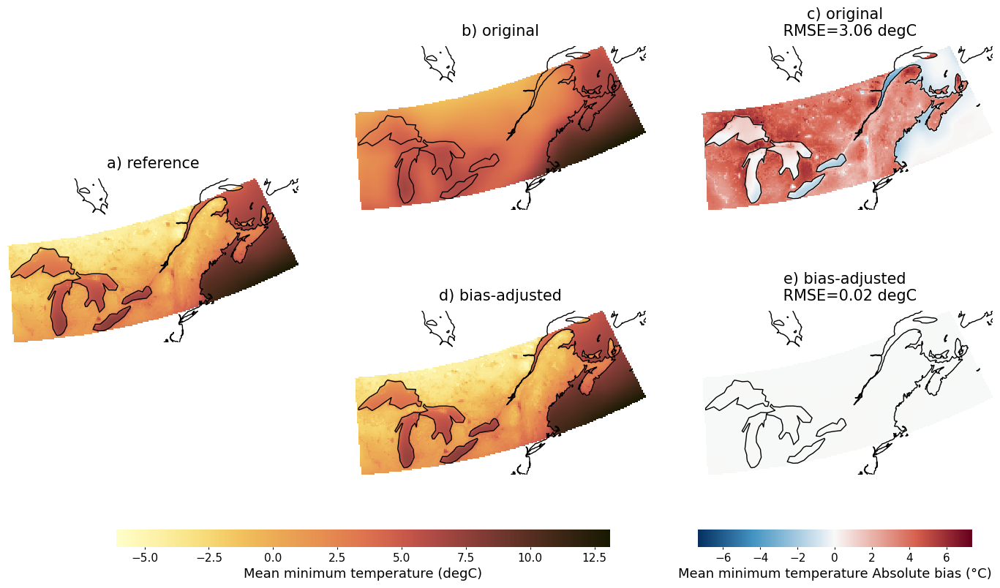

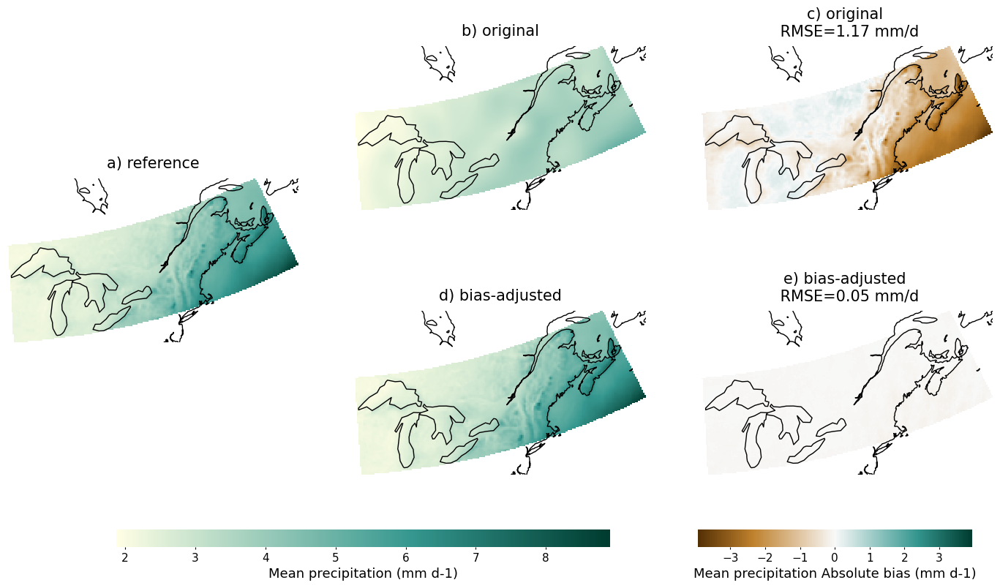

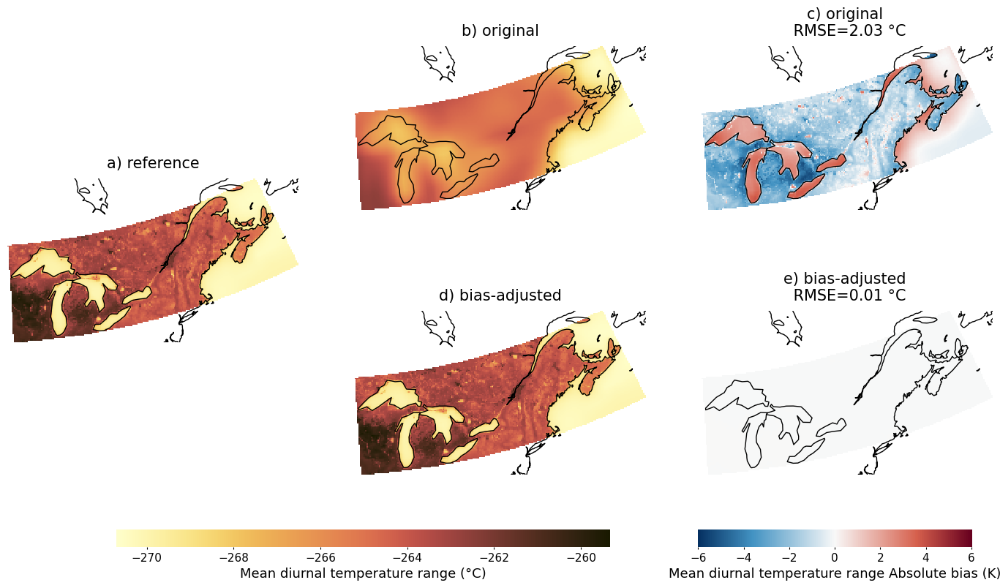

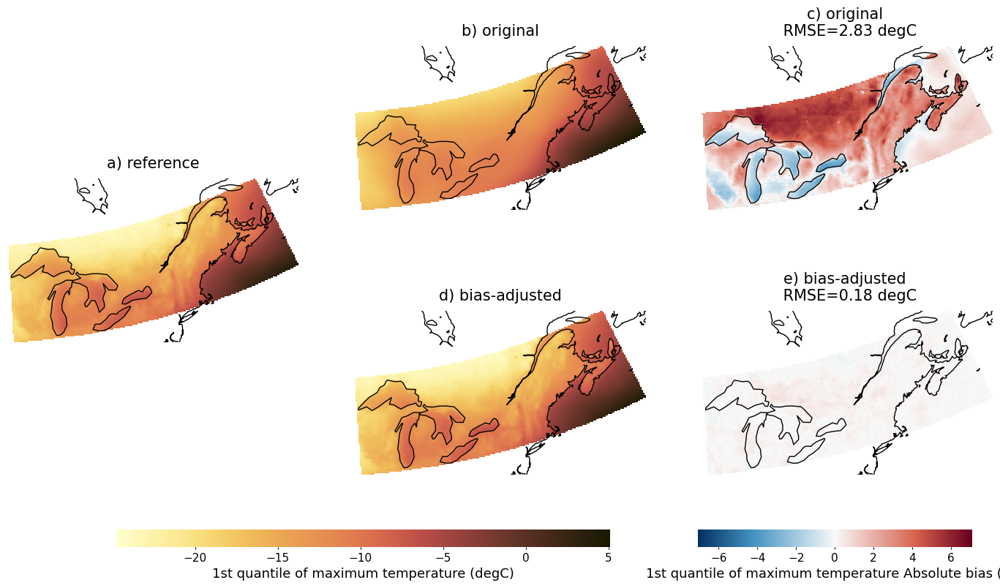

...

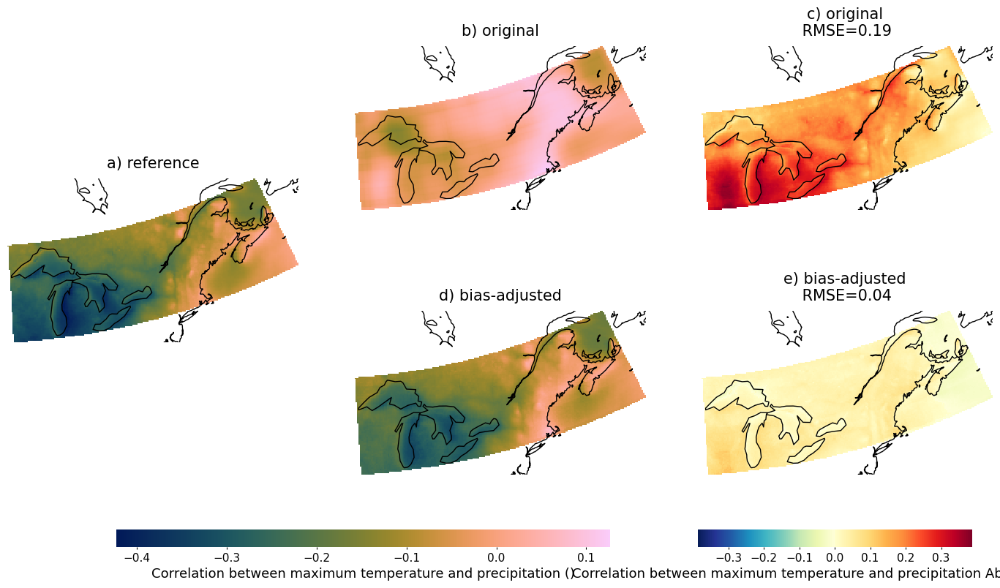

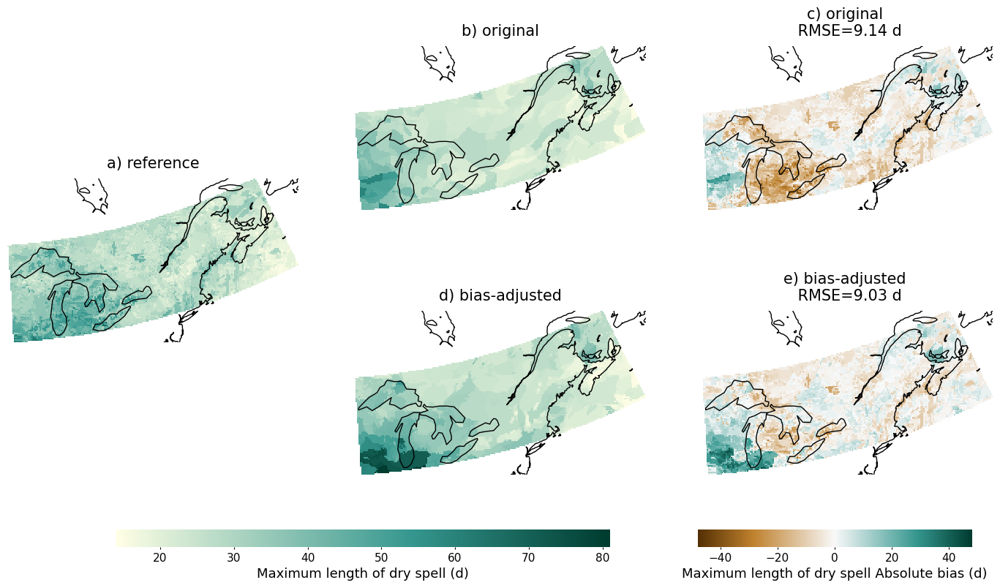

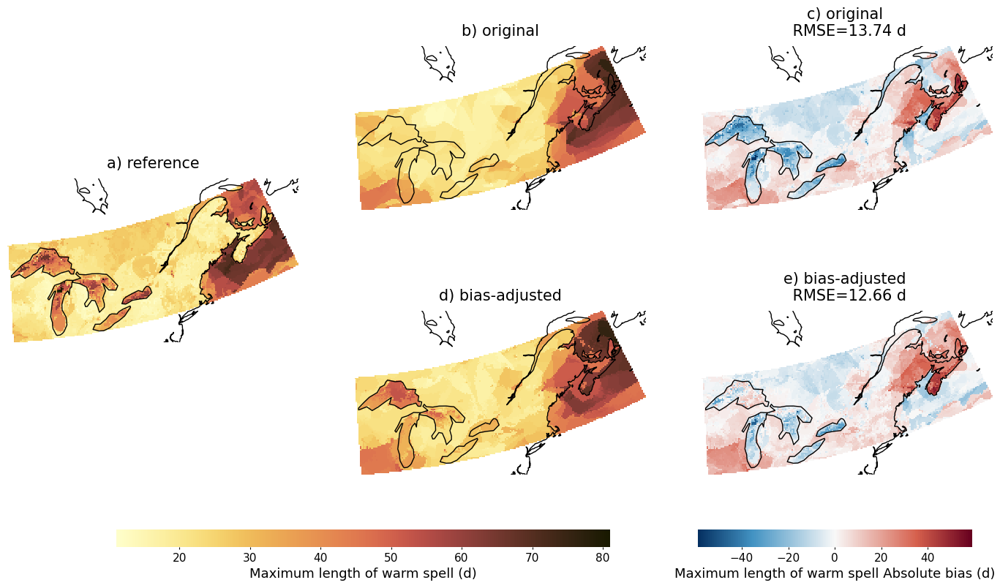

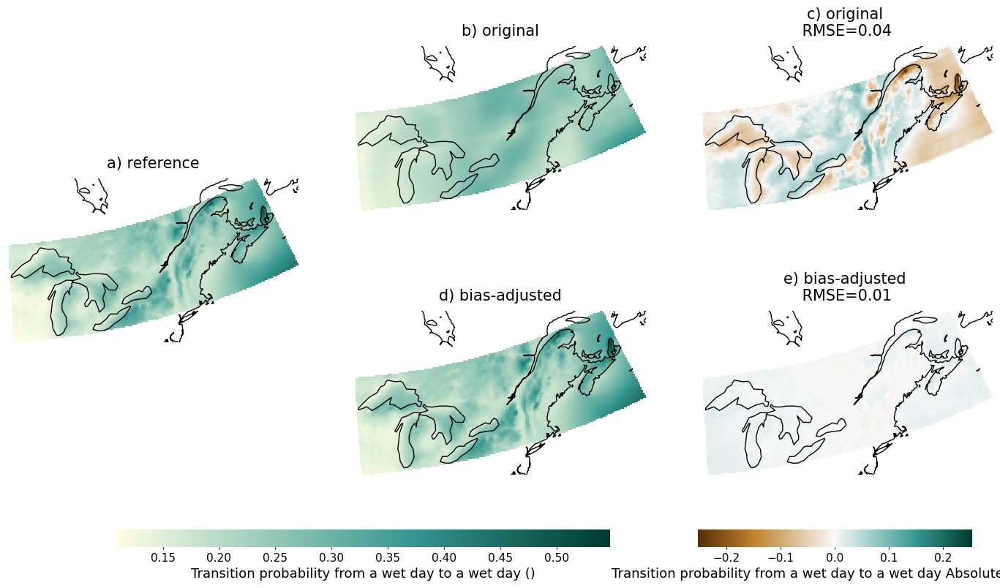

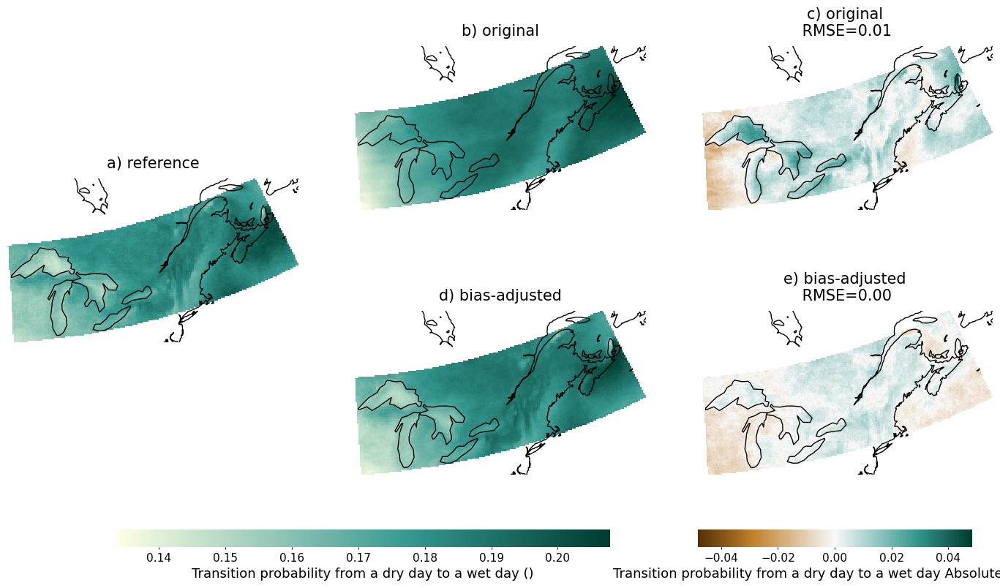

In [9]:
for p in ds_imp.properties.values:
    fig,[ax0,ax1,ax2,ax3,ax4], [cb1,cb2] = maps('CMIP6_CMIP_CNRM-CERFACS_CNRM-ESM2-1_historical_r1i1p1f2_global', 'Magtogoek', p)

/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/tmp/ipykernel_1221874/502446990.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


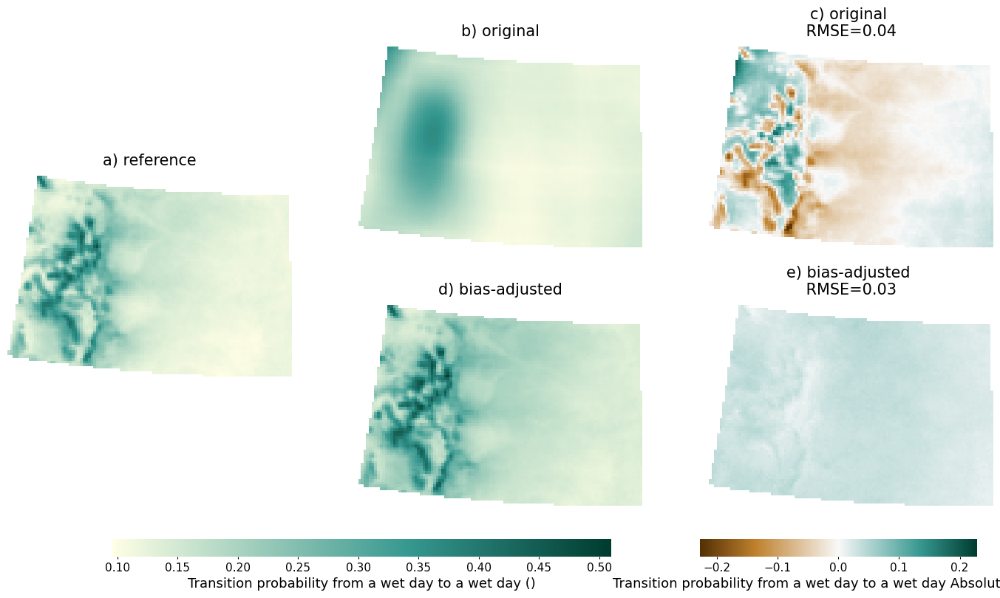

In [6]:
fig,[ax0,ax1,ax2,ax3,ax4], [cb1,cb2] = maps('CMIP6_CMIP_CNRM-CERFACS_CNRM-ESM2-1_historical_r1i1p1f2_global', 'Ute', 'wet_wet')

# one day

/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "long_name" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Co

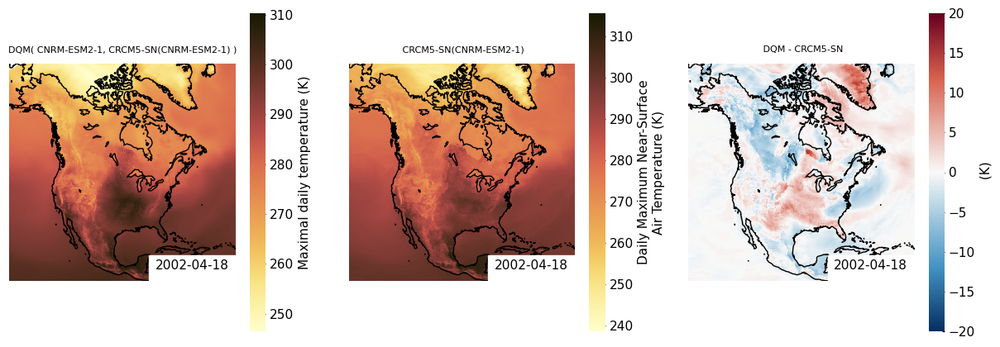

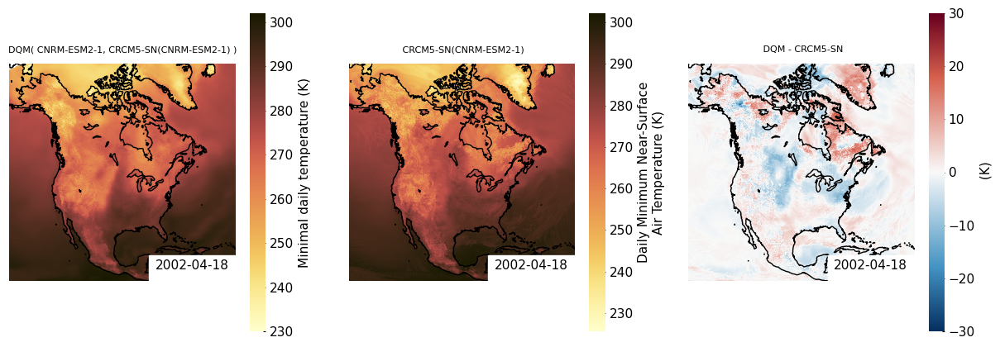

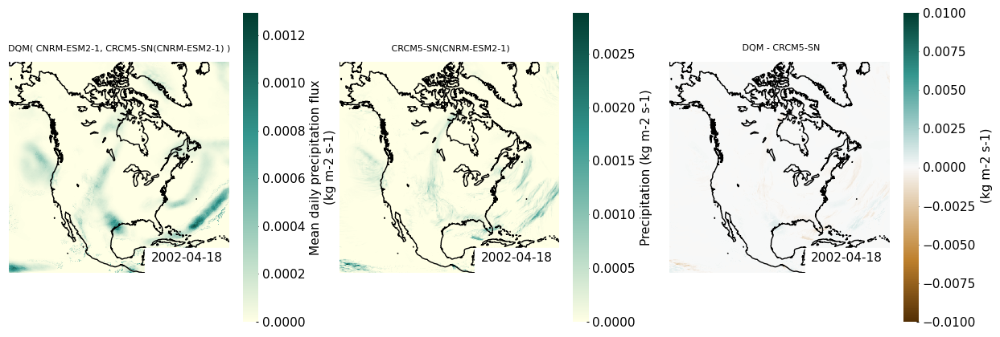

In [10]:
features={ 'lakes':{'scale':'110m', 'edgecolor':'black', 'facecolor':'none'},'coastline':{'scale':'50m'}}

for var in ['tasmax','tasmin', 'pr']:
    for f in np.sort(glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")):
        
        ds=xr.open_zarr(f, decode_timedelta=False)
        map_proj = fg.utils.get_rotpole(ds)
        fig, axs= plt.subplots(1,3, figsize=(15,10), subplot_kw={'projection':map_proj})

        fg.gridmap(ds.sel(time='2002-04-18'),plot_kw={ "cbar_kwargs": {"shrink": 0.5,}},ax=axs[0], features=features, show_time=True)
        axs[0].set_title('DQM( CNRM-ESM2-1, CRCM5-SN(CNRM-ESM2-1) )'  , fontsize=8)
        
        ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical', xrfreq='D', variable=var).to_dataset()
        ds_ref['time']=ds_ref.time.dt.floor('D') 
        fg.gridmap(ds_ref.sel(time='2002-04-18'),plot_kw={ "cbar_kwargs": {"shrink": 0.5,}},ax=axs[1], features=features, show_time=True   )
        axs[1].set_title(' CRCM5-SN(CNRM-ESM2-1)'  , fontsize=8)
        
        diff=ds.sel(time='2002-04-18') - ds_ref.sel(time='2002-04-18')
        fg.gridmap(diff,plot_kw={ "cbar_kwargs": {"shrink": 0.5,}},ax=axs[2], features=features, show_time=True, divergent=0   )
        axs[2].set_title(' DQM - CRCM5-SN'  , fontsize=8)

/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/

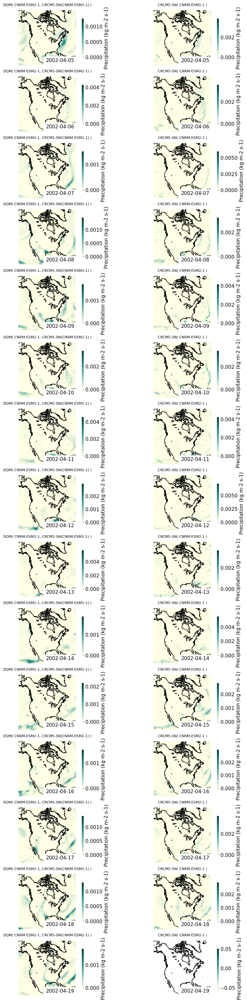

In [11]:
var='pr'
f=glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")[0]
map_proj = fg.utils.get_rotpole(ds)
fig, axs= plt.subplots(15,2, figsize=(10,40), subplot_kw={'projection':map_proj})
ds=xr.open_zarr(f, decode_timedelta=False)
ds['pr'].attrs['long_name']='Precipitation'
ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical', xrfreq='D', variable=var).to_dataset().sel(time=slice('1950','2014'))
ds_ref['time']=ds_ref.time.dt.floor('D') 

for t in range(19074,19089):
    fg.gridmap(ds.isel(time=t),plot_kw={ "cbar_kwargs": {"shrink": 0.7}},ax=axs[t-19074,0], features=features, show_time=True)
    axs[t-19074,0].set_title('DQM( CNRM-ESM2-1, CRCM5-SN(CNRM-ESM2-1) )'  , fontsize=8)
    
    # +13 for the leap years
    fg.gridmap(ds_ref.isel(time=t+13),plot_kw={ "cbar_kwargs": {"shrink": 0.7}},ax=axs[t-19074,1], features=features, show_time=True)
    axs[t-19074,1].set_title('CRCM5-SN( CNRM-ESM2-1 )'  , fontsize=8)

/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor

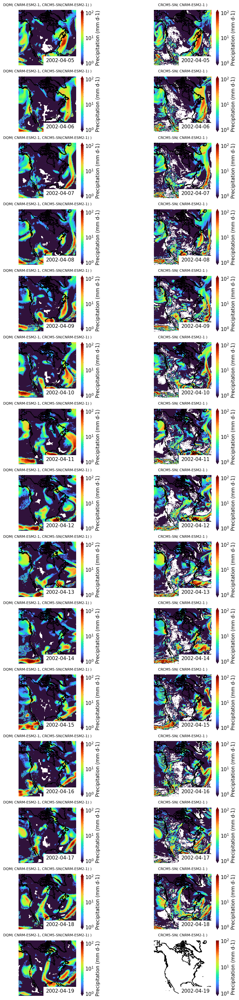

In [12]:
def fgplot_martin(ds, ax):

    #data = xs.spatial.subset(ds.pr,method='bbox', name='QC', lon_bnds=[-116, -50], lat_bnds=[25, 70])
    with xr.set_options(keep_attrs=True):
        data=xc.core.units.convert_units_to(ds.pr, 'mm/day', context='hydro')
    # fix xclim bug
    #data.attrs['long_name']= 'Precipitation'

    ax=fg.gridmap(data,
                  #ax=ax,
                  plot_kw=dict(norm=LogNorm(vmin=1, vmax=100), cmap='turbo', 
                              cbar_kwargs=dict(orientation="vertical", fraction=0.046, pad=0.04)),
                  features=dict(coastline=dict(scale='10m', color='black', linewidth=1)),
                  #projection=ccrs.PlateCarree(),
                  ax=ax,
                  show_time=True,
                 )

    # ax.set_xlim(-95, -50)
    # ax.set_ylim(25, 70)

    #return ax

var='pr'
f=glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")[0]
map_proj = fg.utils.get_rotpole(ds)
fig, axs= plt.subplots(15,2, figsize=(10,40), subplot_kw={'projection':map_proj})
ds=xr.open_zarr(f, decode_timedelta=False)
ds['pr'].attrs['long_name']='Precipitation'
ds['pr'].attrs['grid_mapping']='crs'
ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical', xrfreq='D', variable=var).to_dataset().sel(time=slice('1950','2014'))
ds_ref['time']=ds_ref.time.dt.floor('D') 

for t in range(19074,19089):
    fgplot_martin(ds.isel(time=t), ax=axs[t-19074,0])
    #fg.gridmap(ds.isel(time=t),plot_kw={ "cbar_kwargs": {"shrink": 0.7}},ax=axs[t-19074,0], features=features, show_time=True)
    axs[t-19074,0].set_title('DQM( CNRM-ESM2-1, CRCM5-SN(CNRM-ESM2-1) )'  , fontsize=8)
    
    # +13 for the leap years
    fgplot_martin(ds_ref.isel(time=t+13), ax=axs[t-19074,1])
    #fg.gridmap(ds_ref.isel(time=t+13),plot_kw={ "cbar_kwargs": {"shrink": 0.7}},ax=axs[t-19074,1], features=features, show_time=True)
    axs[t-19074,1].set_title('CRCM5-SN( CNRM-ESM2-1 )'  , fontsize=8)

2026-01-22 15:16:29 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:29 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.


2026-01-22 15:16:30 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:30 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:112: UserWarning: CFTimeIndex converted to pandas DatetimeIndex with a 'standard' calendar.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


2026-01-22 15:16:31 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:32 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.


2026-01-22 15:16:32 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:32 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:112: UserWarning: CFTimeIndex converted to pandas DatetimeIndex with a 'standard' calendar.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


2026-01-22 15:16:34 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:34 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.


2026-01-22 15:16:34 INFO     xscen.spatial   Loading longitude for more efficient subsetting.


INFO:xscen.spatial:Loading longitude for more efficient subsetting.


2026-01-22 15:16:34 INFO     xscen.spatial   Loading latitude for more efficient subsetting.


INFO:xscen.spatial:Loading latitude for more efficient subsetting.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:112: UserWarning: CFTimeIndex converted to pandas DatetimeIndex with a 'standard' calendar.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


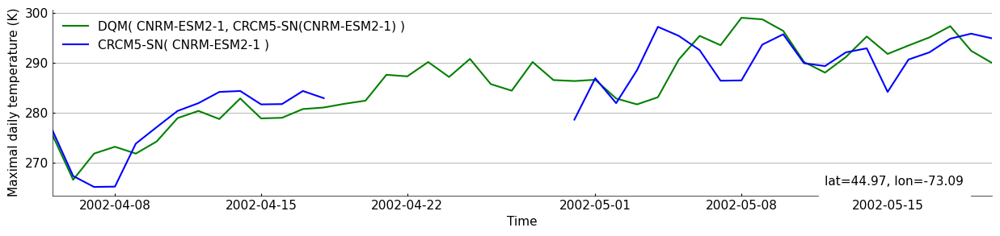

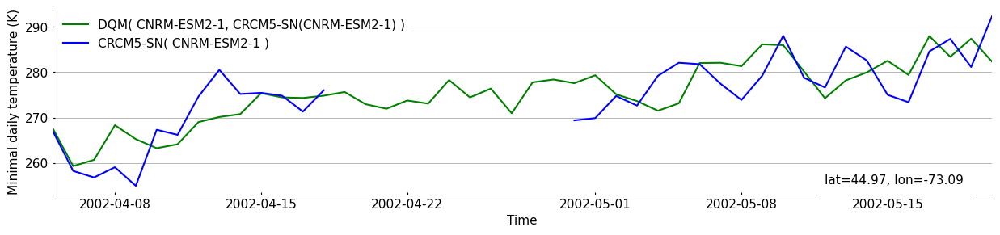

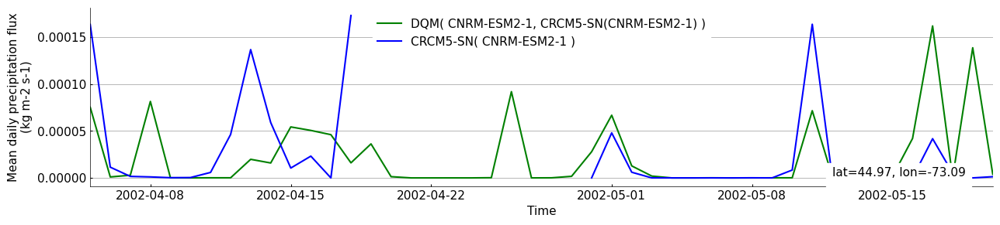

In [13]:
for var in ['tasmax','tasmin', 'pr']:

    f=glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")[0]
    map_proj = fg.utils.get_rotpole(ds)
    ds=xr.open_zarr(f, decode_timedelta=False)
    ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical', xrfreq='D', variable=var).to_dataset().sel(time=slice('1950','2014'))
    ds_ref['time']=ds_ref.time.dt.floor('D') 

    ds=xs.spatial.subset(ds, method='gridpoint', name='mtl', lat=45, lon=-73)
    ds_ref=xs.spatial.subset(ds_ref, method='gridpoint', name='mtl', lat=45, lon=-73)

    fg.timeseries({'DQM( CNRM-ESM2-1, CRCM5-SN(CNRM-ESM2-1) )':ds.isel(time=slice(19074,19120)),
                   'CRCM5-SN( CNRM-ESM2-1 )':ds_ref.isel(time=slice(19074+13,19120+13))},
                  plot_kw={'DQM( CNRM-ESM2-1, CRCM5-SN(CNRM-ESM2-1) )':{'color':'green'},
                   'CRCM5-SN( CNRM-ESM2-1 )':{'color':'blue'},},
                   fig_kw={'figsize':(15,3)},
                   show_lat_lon=True)



# distribution

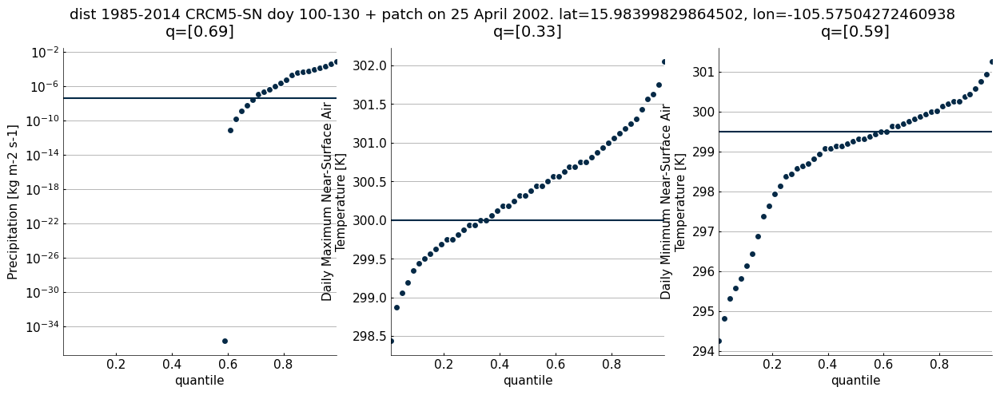

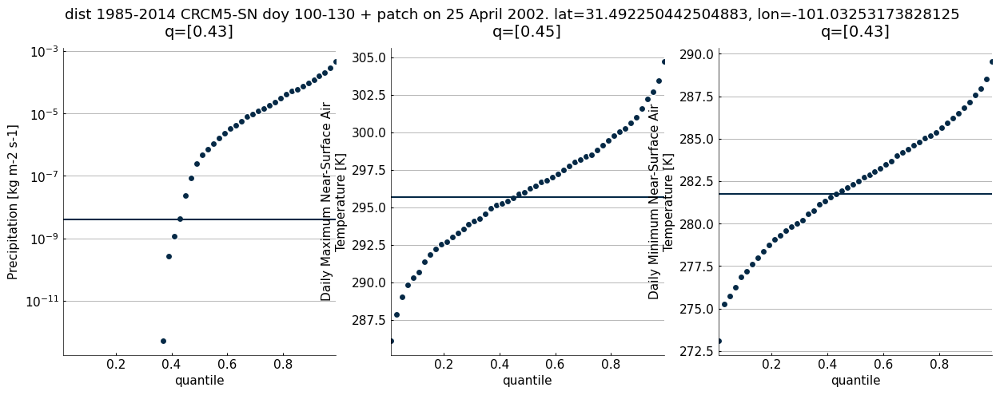

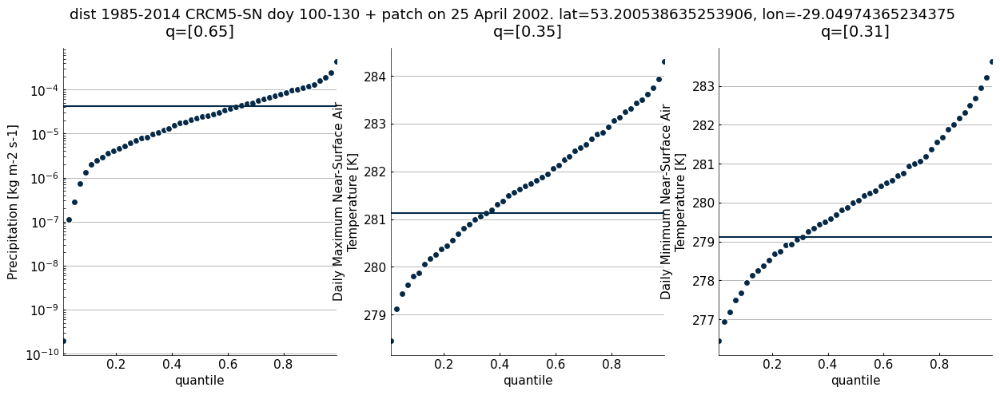

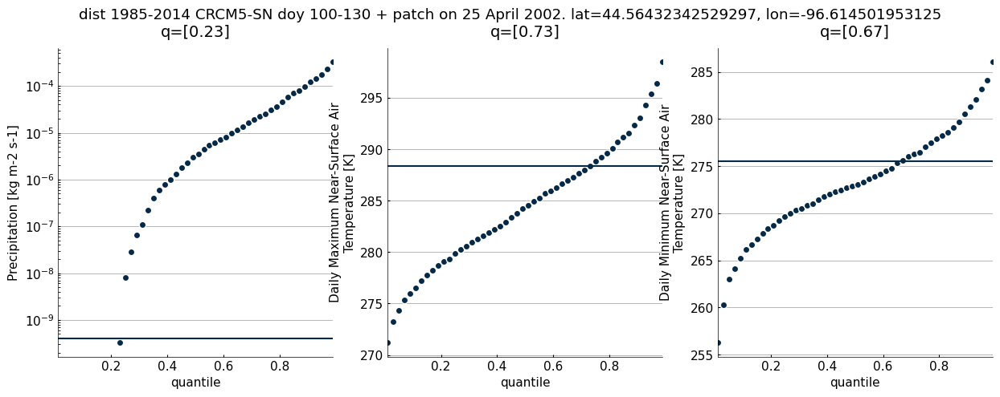

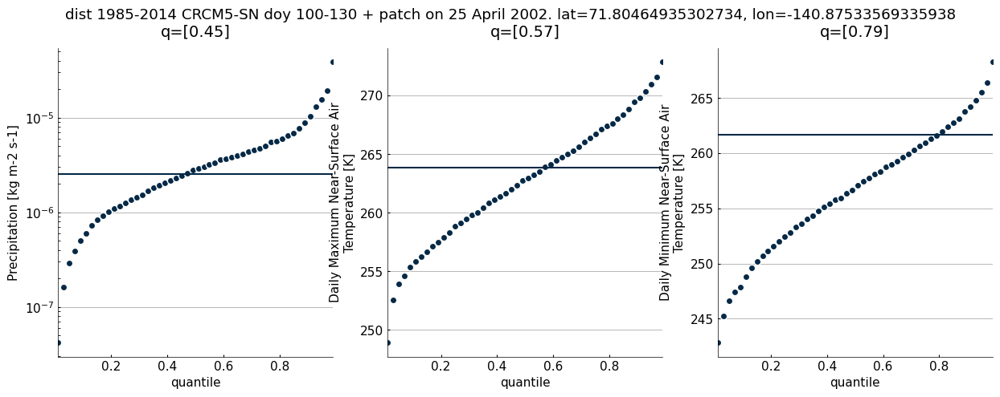

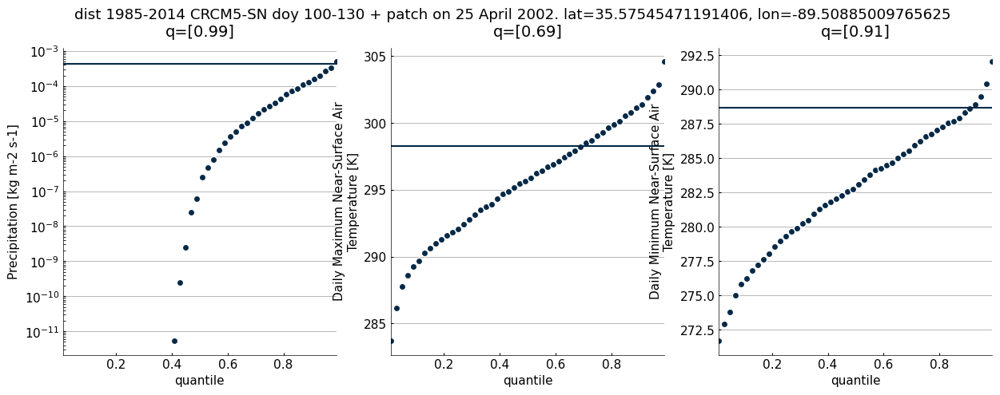

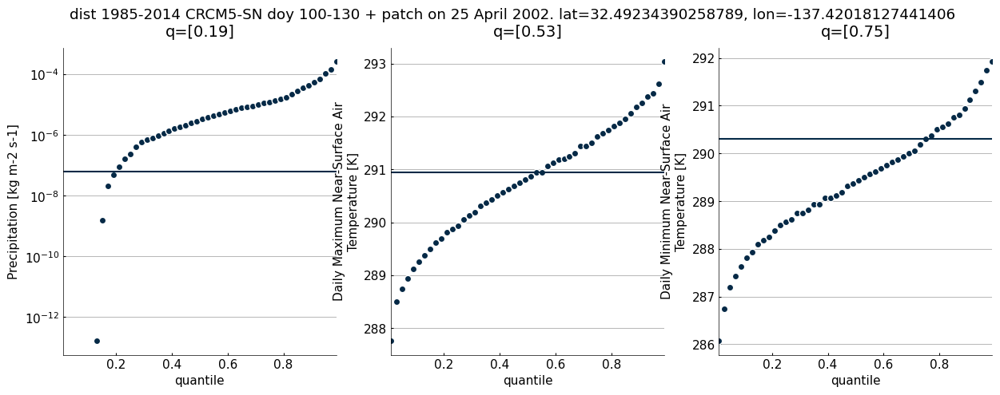

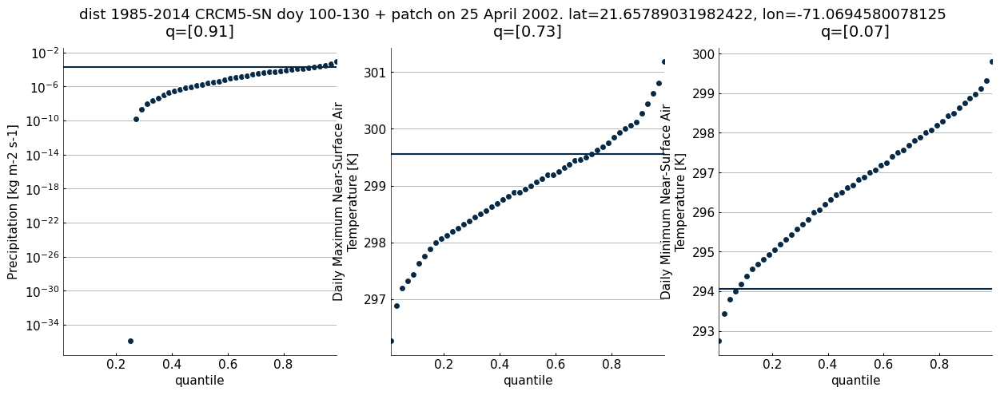

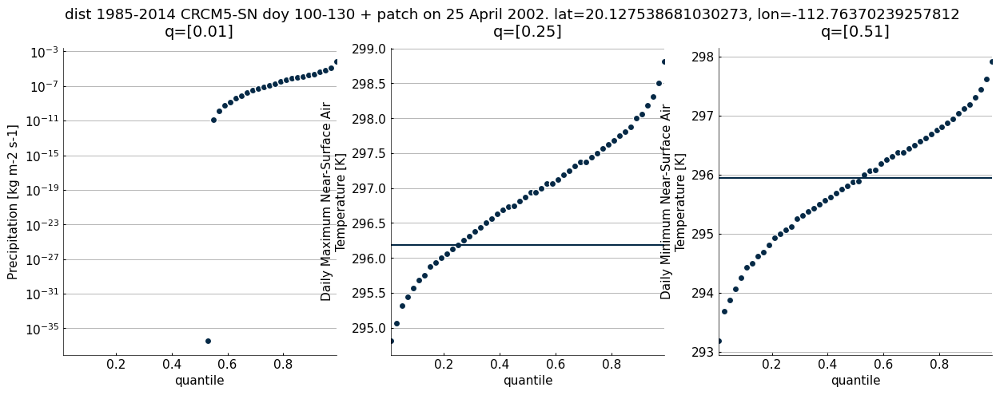

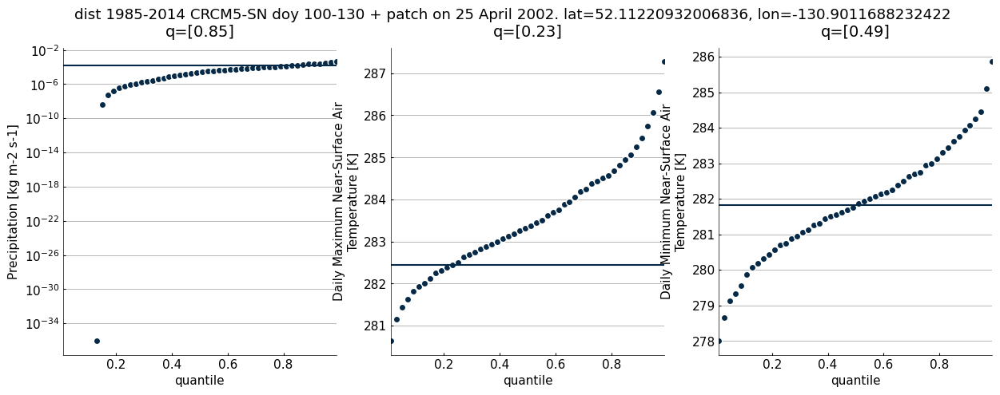

In [14]:
for x in range(10):
    irlat=np.random.randint(628)
    irlon=np.random.randint(655)
    fig, axs=plt.subplots(1,3, figsize=(15,5))
    for i,var in enumerate(['pr', 'tasmax', 'tasmin']):
        ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical',
                          xrfreq='D', variable=var).to_dataset(
            xarray_open_kwargs={'engine':'h5netcdf'}).sel(time=slice('1985','2014'))
        ds_ref=ds_ref.isel(rlat=irlat, rlon=irlon)


        doy = ds_ref.time.dt.dayofyear

        mask = ((doy <= 130) & (doy >= 100))

        ds_win = ds_ref.where(mask, drop=True)
        #ds_win[var].plot.hist(ax=axs[0,i])
        #if var =='pr':
        #    axs[0,i].set_xscale('log')
        
        quantiles=ds_win.quantile(xsdba.utils.equally_spaced_nodes(50))
        quantiles.plot.scatter(x='quantile', y=var, ax=axs[i])
        if var =='pr':
            axs[i].set_yscale('log')

        f=glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")[0]
        ds=xr.open_zarr(f, decode_timedelta=False)
        value=ds.isel(rlat=irlat, rlon=irlon).sel(time='2002-04-25')
        axs[i].axhline(value[var].values)
        
        q_index = abs(quantiles - value)[var].argmin("quantile").values
        q_value = quantiles.isel(quantile=q_index)['quantile'].values
        axs[i].set_title(f"q={q_value}")
        
        
        fig.suptitle(f'dist 1985-2014 CRCM5-SN doy 100-130 + patch on 25 April 2002. lat={ds_ref.lat.values}, lon={ds_ref.lon.values}')
        


/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "units" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "long_name" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:879: UserWarning: Colormap warning: Variable group not found. Use the cmap argument.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


pr 0.5131859615815585


/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "units" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "long_name" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:879: UserWarning: Colormap warning: Variable group not found. Use the cmap argument.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


tasmax 0.5216295798230692


/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "units" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "long_name" not found.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:879: UserWarning: Colormap warning: Variable group not found. Use the cmap argument.
/exec/easybuild/software/2023/x86-64-v3/Core/miniforge3/24.11.3-0/envs/xscen-0.13/lib/python3.13/site-packages/figanos/matplotlib/utils.py:228: UserWarning: Attribute "description" not found.


tasmin 0.5216664952735292


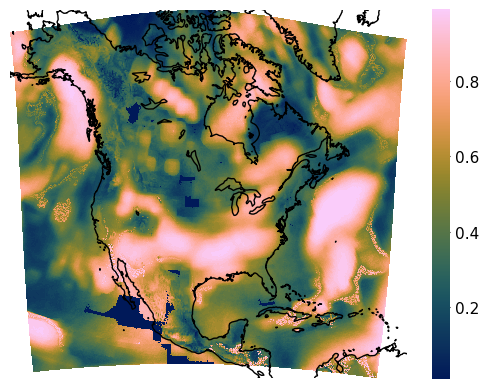

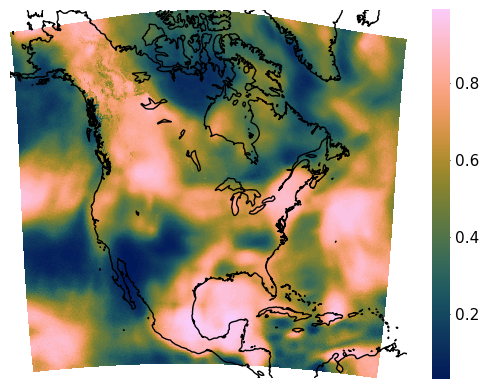

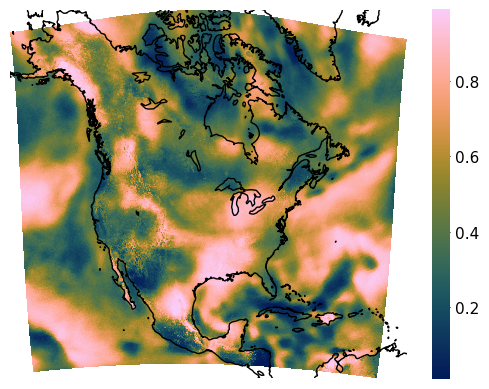

In [17]:
for var in ['pr', 'tasmax', 'tasmin']:
    ds_ref=cat.search(source='CRCM5-SN', driving_model='CNRM-ESM2-1', experiment='historical',
                              xrfreq='D', variable=var).to_dataset(
                xarray_open_kwargs={'engine':'h5netcdf'}).sel(time=slice('1985','2014'))
    ds_ref=ds_ref.sel(rlat=slice(None,30))

    doy = ds_ref.time.dt.dayofyear

    mask = ((doy <= 130) & (doy >= 100))

    ds_win = ds_ref.where(mask, drop=True)
    #ds_win[var].plot.hist(ax=axs[0,i])
    #if var =='pr':
    #    axs[0,i].set_xscale('log')

    quantiles=ds_win.quantile(xsdba.utils.equally_spaced_nodes(50), dim='time')
    quantiles

    f=glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO6_v20_CRCM5-SN-CNRM-ESM2-1/CMIP6/CMIP/NAM-M3/*/*/*/*/day/*/*{var}*")[0]
    ds=xr.open_zarr(f, decode_timedelta=False)
    ds=ds.sel(time='2002-04-25')
    ds=ds.sel(rlat=slice(None,30))

    q_index = abs(quantiles - ds)[var].argmin("quantile")
    q_value = quantiles.isel(quantile=q_index.compute())['quantile']
    q_value['crs']=ds_ref.crs
    q_value.attrs['grid_mapping']='crs'

    features={ 'lakes':{'scale':'110m', 'edgecolor':'black', 'facecolor':'none'},'coastline':{'scale':'50m'}}

    fg.gridmap(q_value, features=features)
    print(var, q_value.mean().values)